In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#importing the data
train_x = pd.read_csv("X_train.csv")
train_y = pd.read_csv("y_train.csv")

## Dataset introdcution

This dataset has been generated by  moveable robot equiped with sensors, it drives over different terrains (concrete, carpets, wood,...)
of which there are a total of 9.
The task here is to predict the surface that the robot is driving on based on the measurement values for linear and angular accelaration,
orientation and so on.

In [24]:
#Training dataset first look
train_x.describe()

,series_id,measurement_number,orientation_X,orientation_Y,orientation_Z,orientation_W,angular_velocity_X,angular_velocity_Y,angular_velocity_Z,linear_acceleration_X,linear_acceleration_Y,linear_acceleration_Z
count,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000,487680.000000
mean,1904.500000,63.500000,-0.018050,0.075062,0.012458,-0.003804,0.000178,0.008338,-0.019184,0.129281,2.886468,-9.364886
std,1099.853353,36.949327,0.685696,0.708226,0.105972,0.104299,0.117764,0.088677,0.229153,1.870600,2.140067,2.845341
min,0.000000,0.000000,-0.989100,-0.989650,-0.162830,-0.156620,-2.371000,-0.927860,-1.268800,-36.067000,-121.490000,-75.386000
25%,952.000000,31.750000,-0.705120,-0.688980,-0.089466,-0.106060,-0.040752,-0.033191,-0.090743,-0.530833,1.957900,-10.193000
50%,1904.500000,63.500000,-0.105960,0.237855,0.031949,-0.018704,0.000084,0.005412,-0.005335,0.124980,2.879600,-9.365300
75%,2857.000000,95.250000,0.651803,0.809550,0.122870,0.097215,0.040527,0.048068,0.064604,0.792263,3.798800,-8.522700
max,3809.000000,127.000000,0.989100,0.988980,0.155710,0.154770,2.282200,1.079100,1.387300,36.797000,73.008000,65.839000


In [25]:
#train_y first look
train_y.describe()

,series_id,group_id
count,3810.000000,3810.000000
mean,1904.500000,37.601312
std,1099.996591,20.982743
min,0.000000,0.000000
25%,952.250000,19.000000
50%,1904.500000,39.000000
75%,2856.750000,55.000000
max,3809.000000,72.000000


## Dataset attributes/features

 - **series_id**; Each series represents 128 measurements on a single surface, there are 3809 series in total
 - **measurement_number**; represents the measurement number of the measurement in a certain series, max value is 127, min value 0
 - **orientation_X**; for this task quaternions have been used, this is one of them. They provide a convenient mathematical notation for representing orientations and rotations of objects in three dimensions. Compared to Euler angles they are simpler to compose and avoid the problem of gimbal lock. 
 - **orientation_Y,orientation_Z,orientation_W** are the other three quartions.
 - **angular_velocity_X and Y and Z** represent the angular velocity of the robot
 - **linear_acceleration_X and Y and Z** represent the linear acceleration of the robot
 
 the **train_y** dataset contains the surface of every entry of the train_x dataset, the foreign key is the series_id. It also contains a group_id (can be used for stratified K-Fold, more on that later).


In [ ]:
#idee: Pro Serie ein Histogramm Plot für jedes Attribut
train_x_sub = train_x[train_x['series_id']==0]
train_x_sub = train_x_sub.drop(['row_id', 'series_id', 'measurement_number'], axis=1)

hist = train_x_sub.hist()
print(hist)


In [3]:

#idee: alle concrete beispiele hernehmen, mittelwert aller attribute erstellen, vergleichen mit anderen, großer unterschied?
#print(train_y[train_y['series_id'] == 1])
#print(train_y[train_y['series_id'] == 0]['surface'])

#train_y_surface_list = train_y['surface'].tolist()
surface = []

for entry in train_x['series_id']:
    temp = str(train_y[train_y['series_id'] == entry]['surface'].values)
    surface.append(temp)
    print(temp)
    


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['tiled']


['hard_tiles_large_space']
['hard_tiles_large_space']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['ha

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concre

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']


['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['s

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['s

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_c

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles'

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_t

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['f

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['co

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['ti

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['so

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_larg

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pv

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_t

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['ti

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_s

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concret

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['w

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['sof

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_spa

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['carpet']
['carpet']
['carp

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['f

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
[

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_lar

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet'

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
[

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pv

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['soft_pvc']
['soft_pvc']
['

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc'

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['so

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['s

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']


['soft_tiles']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concre

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc'

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carp

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_conc

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['t

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['w

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['t

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete'

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['sof

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_ti

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc'

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['s

['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['carpet']
['carpet']
['c

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['til

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_lar

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_tiles']
['hard_til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['car

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['til

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concre

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['concrete']
['concrete']
['concrete']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles'

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['so

['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_tiles']
['soft_til

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['c

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_spa

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['woo

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['t

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['carpet']
['carpet']
['carpet']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_lar

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['c

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pv

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_p

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carp

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['har

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpe

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['w

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['c

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_l

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['ti

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['woo

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_spac

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['til

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['t

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concre

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tile

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['co

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete'

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['woo

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concr

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']


['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fi

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concret

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concret

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['c

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['fine_concrete']
['fine_concrete']
['fi

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['h

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['c

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['co

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concret

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['so

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['ca

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['w

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['til

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concre

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete'

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_s

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_co

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['con

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['s

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']


['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['co

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_la

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
[

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wo

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['carpet']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['woo

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood'

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']


['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
[

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['so

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
[

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['f

['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_con

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concret

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_co

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
[

['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['conc

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tile

['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['hard_tiles_large_space']
['concrete']
['concrete']
['

['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
['fine_concrete']
[

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']
['soft_pvc']

['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']
['concrete']

['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['tiled']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['wood']
['woo

surface
['carpet']                    [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['concrete']                  [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['fine_concrete']             [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['hard_tiles']                [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['hard_tiles_large_space']    [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['soft_pvc']                  [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['soft_tiles']                [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['tiled']                     [[AxesSubplot(0.125,0.125;0.775x0.755)]]
['wood']                      [[AxesSubplot(0.125,0.125;0.775x0.755)]]
dtype: object

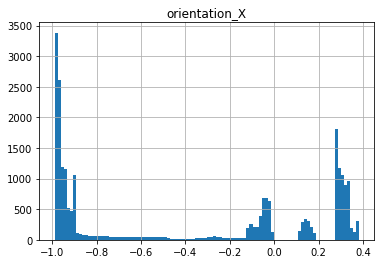

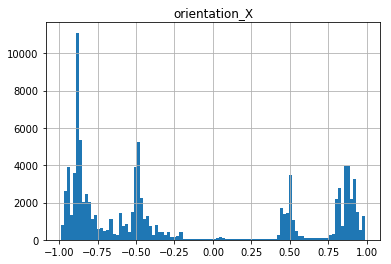

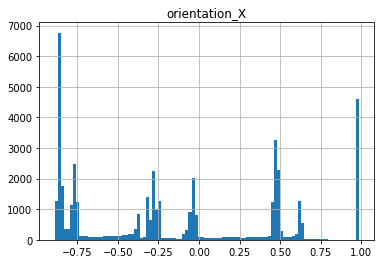

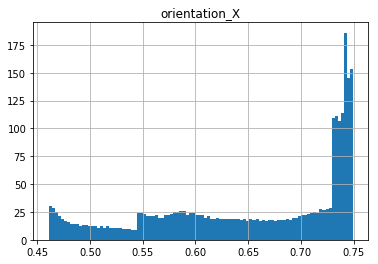

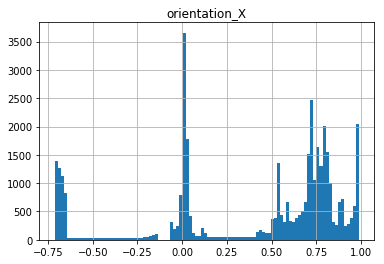

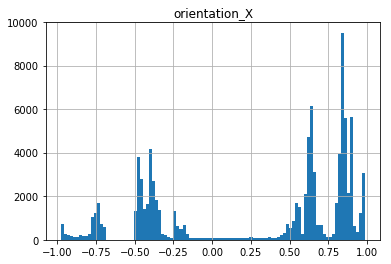

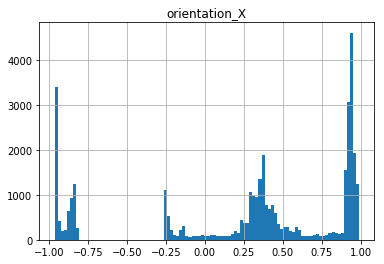

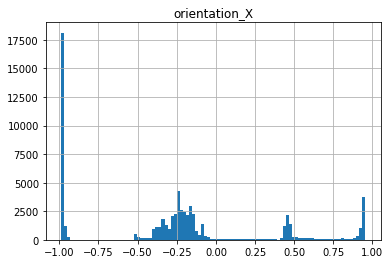

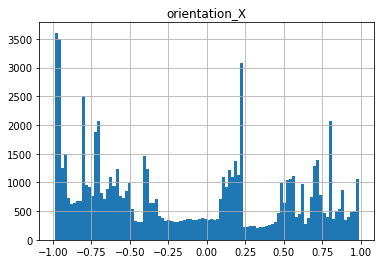

In [18]:
#spalte mit Oberfläche zu train_x hinzufügen:
train_x['surface'] = surface
train_x.groupby(['surface']).hist(column = "orientation_X", bins=100)

In [ ]:
'''
def quaternion_to_euler(x, y, z, w):
    import math
    t0 = +2.0 * (w * x + y * z)
    t1 = +1.0 - 2.0 * (x * x + y * y)
    X = math.atan2(t0, t1)

    t2 = +2.0 * (w * y - z * x)
    t2 = +1.0 if t2 > +1.0 else t2
    t2 = -1.0 if t2 < -1.0 else t2
    Y = math.asin(t2)

    t3 = +2.0 * (w * z + x * y)
    t4 = +1.0 - 2.0 * (y * y + z * z)
    Z = math.atan2(t3, t4)

    return X, Y, Z

'''